In [1]:
# pip install plotly

In [2]:
import xarray as xr
import numpy as np
import pandas as pd
import plotly.graph_objects as go
import glob
import os
import cftime
import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)

In [3]:
data_path = '/data1/drought_dataset/spei/spei12/'

Select just January

In [4]:
file_list = sorted(glob.glob(os.path.join(data_path, 'SPEI12_*01.nc')))
# print(file_list)

In [5]:
test_first_dataset = xr.open_dataset(file_list[0])
print(test_first_dataset)

<xarray.Dataset>
Dimensions:  (lat: 721, lon: 1440, time: 1)
Coordinates:
  * time     (time) datetime64[ns] 1940-01-01T06:00:00
  * lon      (lon) float64 -180.0 -179.8 -179.5 -179.2 ... 179.2 179.5 179.8
  * lat      (lat) float64 90.0 89.75 89.5 89.25 ... -89.25 -89.5 -89.75 -90.0
Data variables:
    SPEI12   (time, lat, lon) float64 ...
Attributes:
    CDI:          Climate Data Interface version 2.1.1 (https://mpimet.mpg.de...
    Conventions:  CF-1.6
    source:       DRYFALL v0.1
    institution:  ECMWF
    title:        SPEI12
    description:  Drought Index: Standardized Drought Index calculated accord...
    history:      Thu Feb 15 13:45:57 2024: cdo -selyear,1940 -selmon,1 /scra...
    CDO:          Climate Data Operators version 2.1.1 (https://mpimet.mpg.de...


In [6]:
test_last_dataset = xr.open_dataset(file_list[-1])
print(test_last_dataset)

<xarray.Dataset>
Dimensions:  (lat: 721, lon: 1440, time: 1)
Coordinates:
  * time     (time) object 2024-01-01 06:00:00
  * lat      (lat) float64 90.0 89.75 89.5 89.25 ... -89.25 -89.5 -89.75 -90.0
  * lon      (lon) float64 -180.0 -179.8 -179.5 -179.2 ... 179.2 179.5 179.8
Data variables:
    SPEI12   (time, lat, lon) float64 ...
Attributes:
    title:        SPEI12
    description:  Drought Index: Standardized Drought Index calculated accord...
    history:      Created 01/03/2024 13:28:01 using DRYFALL.
    institution:  ECMWF
    source:       DRYFALL v0.1


In [7]:
# datasets = [xr.open_dataset(file) for file in file_list[0:12]]
datasets = [xr.open_dataset(file) for file in file_list]
combined_dataset = xr.concat(datasets, dim='time')

In [8]:
print(combined_dataset)

<xarray.Dataset>
Dimensions:  (lat: 721, lon: 1440, time: 86)
Coordinates:
  * time     (time) object 1940-01-01T06:00:00 ... 2024-01-01 06:00:00
  * lon      (lon) float64 -180.0 -179.8 -179.5 -179.2 ... 179.2 179.5 179.8
  * lat      (lat) float64 90.0 89.75 89.5 89.25 ... -89.25 -89.5 -89.75 -90.0
Data variables:
    SPEI12   (time, lat, lon) float64 -9.999e+03 -9.999e+03 ... 1.975 1.975
Attributes:
    CDI:          Climate Data Interface version 2.1.1 (https://mpimet.mpg.de...
    Conventions:  CF-1.6
    source:       DRYFALL v0.1
    institution:  ECMWF
    title:        SPEI12
    description:  Drought Index: Standardized Drought Index calculated accord...
    history:      Thu Feb 15 13:45:57 2024: cdo -selyear,1940 -selmon,1 /scra...
    CDO:          Climate Data Operators version 2.1.1 (https://mpimet.mpg.de...


The coordinate values indicate that the dataset uses a fine grid with 0.25-degree increments: the longitude values cover the entire 360 degrees from -180 to +179.75 degrees and latitude from 90 to -90

In [9]:
print(combined_dataset.attrs)

{'CDI': 'Climate Data Interface version 2.1.1 (https://mpimet.mpg.de/cdi)', 'Conventions': 'CF-1.6', 'source': 'DRYFALL v0.1', 'institution': 'ECMWF', 'title': 'SPEI12', 'description': 'Drought Index: Standardized Drought Index calculated according to the WMO guidelines (see https://library.wmo.int/doc_num.php?explnum_id=7768).', 'history': 'Thu Feb 15 13:45:57 2024: cdo -selyear,1940 -selmon,1 /scratch/nejk/droughts_hist/SPEI12_genlogistic_global_era5_moda_ref1991to2020_19400101to20231001.nc /ec/vol/centaur/nejk/drought_monitor/spei/spei12/SPEI12_genlogistic_global_era5_moda_ref1991to2020_194001.nc\nCreated 04/02/2024 05:31:55 using DRYFALL.', 'CDO': 'Climate Data Operators version 2.1.1 (https://mpimet.mpg.de/cdo)'}


In [10]:
for var in combined_dataset.data_vars:
    print(f"{var}:")
    print(combined_dataset[var].attrs)

SPEI12:
{'long_name': 'Standardized Drought Index (SPEI12)', 'units': '-'}


In [11]:
# print(combined_dataset['time'].values)

In [12]:
original_times = combined_dataset.time.values

def convert_to_datetime64(times):
    converted_times = []
    for time in times:
        # Check if the object is an instance of cftime.DatetimeGregorian
        if isinstance(time, cftime.DatetimeGregorian):
            converted_time = np.datetime64(time.strftime('%Y-%m-%dT%H:%M:%S'))
        else:
            converted_time = np.datetime64(time)
        converted_times.append(converted_time)
    return np.array(converted_times)

# Apply conversion
converted_times = convert_to_datetime64(original_times)
combined_dataset['time'] = ('time', converted_times)
# print(combined_dataset['time'].values)

In [13]:
first_lat_type = type(combined_dataset.lat.values[0])
print("Data type of the first latitude value:", first_lat_type)
first_lon_type = type(combined_dataset.lon.values[0])
print("Data type of the first longitude value:", first_lon_type)

# print("Latitude values in the dataset:", combined_dataset.lat.values)

Data type of the first latitude value: <class 'numpy.float64'>
Data type of the first longitude value: <class 'numpy.float64'>


In [14]:
print("Longitude values in the dataset:", combined_dataset.lon.values)

Longitude values in the dataset: [-180.   -179.75 -179.5  ...  179.25  179.5   179.75]


In [15]:
# print(combined_dataset['SPEI12'].values)

The SPEI indicated by the value -9999.000000 are fill values to denote missing or undefined data. To effectively plot and analyze the SPEI data, we should first replace these invalid values with NaN, which Python handles appropriately in plots and calculations.

In [16]:
combined_dataset['SPEI12'] = combined_dataset['SPEI12'].where(combined_dataset['SPEI12'] != -9999.0) # Replace -9999.0 with NaN across the dataset

In [17]:
# print(combined_dataset['SPEI12'].values)

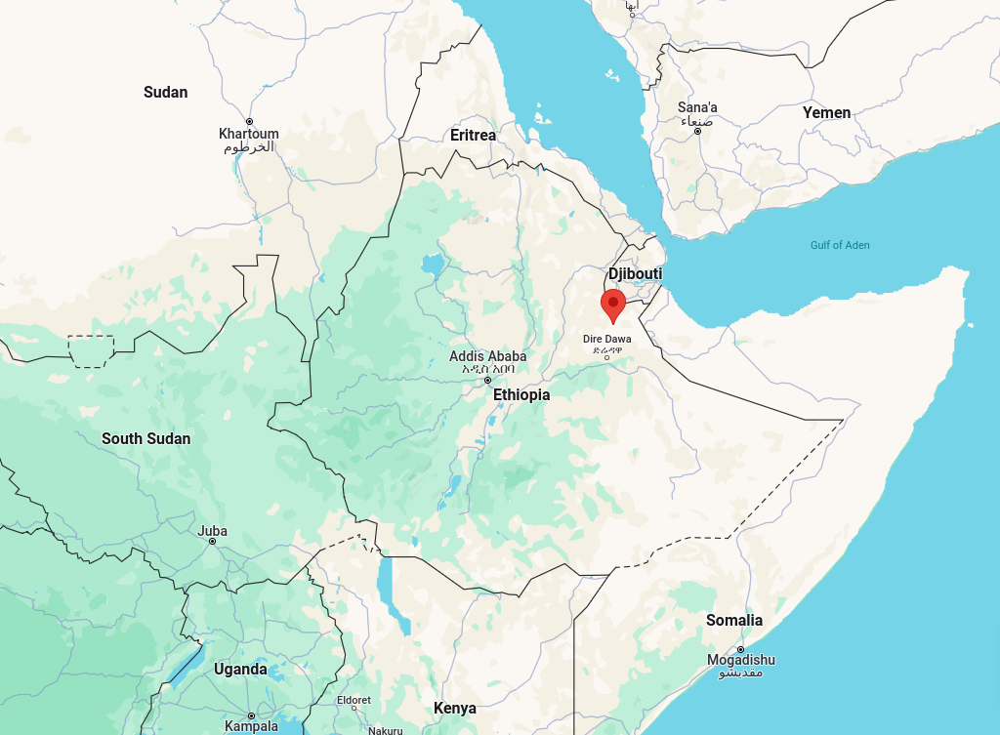

In [18]:
# Select the approximate location for Addis Ababa, Ethiopia
latitude = 9.03
longitude = 38.74

spei12_ethiopia = combined_dataset.sel(lat=latitude, lon=longitude, method='nearest')
spei12_ethiopia_df = spei12_ethiopia.to_dataframe().reset_index() # Convert the xarray DataArray to a pandas DataFrame for easier plotting

print(spei12_ethiopia_df.head())

                 time    lon  lat    SPEI12
0 1940-01-01 06:00:00  38.75  9.0       NaN
1 1941-01-01 06:00:00  38.75  9.0  1.037819
2 1942-01-01 06:00:00  38.75  9.0 -2.833539
3 1943-01-01 06:00:00  38.75  9.0 -1.354242
4 1944-01-01 06:00:00  38.75  9.0 -0.737823


In [19]:
print(spei12_ethiopia_df.tail())

                  time    lon  lat    SPEI12
81 2021-01-01 06:00:00  38.75  9.0  0.802463
82 2022-01-01 06:00:00  38.75  9.0 -0.040245
83 2023-01-01 06:00:00  38.75  9.0 -1.439569
84 2024-01-01 06:00:00  38.75  9.0  1.831334
85 2024-01-01 06:00:00  38.75  9.0  1.831334


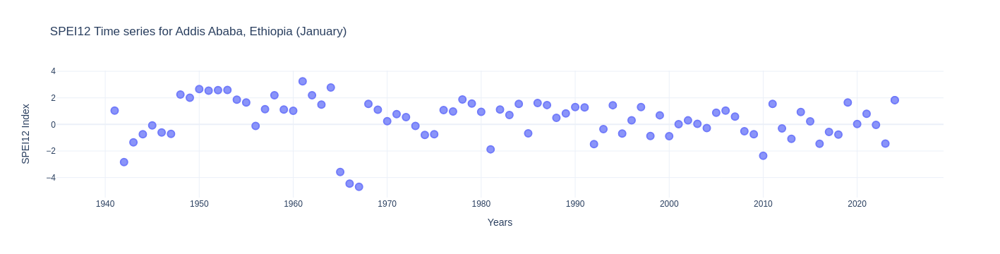

In [22]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=spei12_ethiopia_df['time'], y=spei12_ethiopia_df['SPEI12'],
                        mode='markers',
                        name='SPEI Index',
                        marker=dict(size=10,
                        color='#8A94F9',
                        line=dict(width=2,
                        color='#717BFA'))))
fig.update_layout(title='SPEI12 Time series for Addis Ababa, Ethiopia (January)',
                  xaxis_title='Years',
                  yaxis_title='SPEI12 Index',
                  template='plotly_white')
fig.show()

To represent a wider area of Ethiopia on the chart, instead of focusing on a single point, we might consider aggregating SPEI data across a broader geographic range. This approach involves averaging SPEI values over a defined range of latitudes and longitudes to capture a regional trend rather than a local one.

First, we define the geographic range that covers a significant portion of Ethiopia. Since Ethiopia spans from about 3°N to 14.8°N in latitude and from about 33°E to 48°E in longitude, we select a smaller but representative range within these boundaries.

We use the `sel` method to slice the data within this range and then use `mean()` to aggregate the data over the specified latitude and longitude. This provides a single time series representing the average SPEI over the selected area.

After aggregating the data, we plot this as a time series to observe regional drought trends across the larger area of Ethiopia.

In [23]:
lat_range = slice(5.0, 12.0) # From about 5°N to 12°N
lon_range = slice(36.0, 44.0)  # From about 36°E to 44°E

In [24]:
spei12_ethiopia_region_NOT_WORKING = combined_dataset.sel(lat=lat_range, lon=lon_range)

# Check if there are any valid data points
valid_data_check = spei12_ethiopia_region_NOT_WORKING['SPEI12'].notnull()
print("Any valid data points in the region?:", valid_data_check.any())
print("Count of valid data points:", valid_data_check.sum().values)

Any valid data points in the region?: <xarray.DataArray 'SPEI12' ()>
array(False)
Count of valid data points: 0


In [25]:
print("Dimensions of the subset:", spei12_ethiopia_region_NOT_WORKING.dims)
print("Latitude values around 5 to 12 degrees:")
print(combined_dataset['lat'].sel(lat=lat_range).values)

Dimensions of the subset: Frozen(SortedKeysDict({'time': 86, 'lon': 33, 'lat': 0}))
Latitude values around 5 to 12 degrees:
[]


In [26]:
# Using .sel with method='nearest' but targeting specific latitudes
ethiopia_nearest_lats = combined_dataset.sel(lat=[5, 12], method='nearest')
ethiopia_nearest_lons = combined_dataset.sel(lon=[36, 44], method='nearest')

# Now aggregate using these nearest found coordinates
spei12_ethiopia_region_NOT_WORKING = combined_dataset.sel(lat=slice(ethiopia_nearest_lats.lat.values.min(), ethiopia_nearest_lats.lat.values.max()), 
                                     lon=slice(ethiopia_nearest_lons.lon.values.min(), ethiopia_nearest_lons.lon.values.max()))

print("Nearest latitudes:", ethiopia_nearest_lats.lat.values)
print("Nearest longitudes:", ethiopia_nearest_lons.lon.values)
print("Dimensions of the subset:", spei12_ethiopia_region_NOT_WORKING.dims)
print("Latitude values in the subset:", spei12_ethiopia_region_NOT_WORKING.lat.values)
print("Longitude values in the subset:", spei12_ethiopia_region_NOT_WORKING.lon.values)

Nearest latitudes: [ 5. 12.]
Nearest longitudes: [36. 44.]
Dimensions of the subset: Frozen(SortedKeysDict({'time': 86, 'lon': 33, 'lat': 0}))
Latitude values in the subset: []
Longitude values in the subset: [36.   36.25 36.5  36.75 37.   37.25 37.5  37.75 38.   38.25 38.5  38.75
 39.   39.25 39.5  39.75 40.   40.25 40.5  40.75 41.   41.25 41.5  41.75
 42.   42.25 42.5  42.75 43.   43.25 43.5  43.75 44.  ]


In [27]:
# Check the shape of data slices
if 'SPEI12' in combined_dataset:
    print("Shape of latitude slice:", combined_dataset.sel(lat=ethiopia_nearest_lats.lat.values)['SPEI12'].shape)
    print("Shape of longitude slice:", combined_dataset.sel(lon=ethiopia_nearest_lons.lon.values)['SPEI12'].shape)

Shape of latitude slice: (86, 2, 1440)
Shape of longitude slice: (86, 721, 2)


In [28]:
spei12_ethiopia_region = combined_dataset.sel(lat=[5, 5.25, 5.50, 5.75, 6, 6.25, 6.50, 6.75, 7, 7.25, 7.50, 7.75, 8, 8.25, 8.50, 8.75, 9, 9.25, 9.50, 9.75, 10, 10.25, 10.50, 10.75, 11, 11.25, 11.50, 11.75, 12], lon=[36., 36.25, 36.5, 36.75, 37., 37.25, 37.5, 37.75, 38., 38.25, 38.5, 38.75, 39., 39.25, 39.5, 39.75, 40., 40.25, 40.5, 40.75, 41., 41.25, 41.5, 41.75, 42., 42.25, 42.5, 42.75, 43., 43.25, 43.5, 43.75, 44.])
print("Shape of combined lat-lon slice:", spei12_ethiopia_region['SPEI12'].shape)

Shape of combined lat-lon slice: (86, 29, 33)


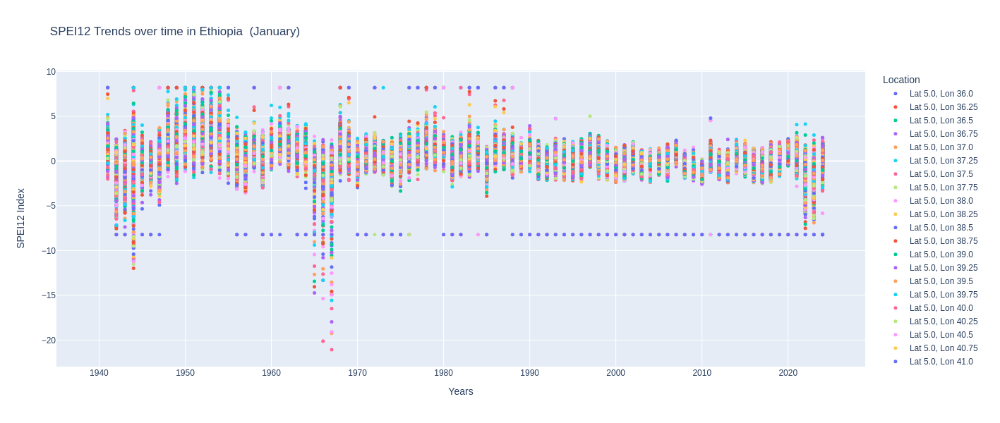

In [31]:
spei_values = spei12_ethiopia_region['SPEI12'].values
times = spei12_ethiopia_region['time'].values

# Create traces for each latitude-longitude pair
traces = []
lat_points = spei12_ethiopia_region['lat'].values
lon_points = spei12_ethiopia_region['lon'].values

for i, lat in enumerate(lat_points):
    for j, lon in enumerate(lon_points):
        trace = go.Scatter(
            x=times,
            y=spei_values[:, i, j],
            mode='markers',
            name=f'Lat {lat}, Lon {lon}',
            marker=dict(size=5),
            hovertemplate=(
                f"SPEI12 Index: %{{y:.2f}}<br>Time: %{{x}}<br>Lat: {lat}<br>Lon: {lon}<extra></extra>"
            )
        )
        traces.append(trace)

fig = go.Figure(traces)

fig.update_layout(
    title='SPEI12 Trends over time in Ethiopia  (January)',
    xaxis_title='Years',
    yaxis_title='SPEI12 Index',
    legend_title='Location',
    height=600 
)

fig.show()

The irregular traces are relative of an area near Djjbouti (need more investigation)

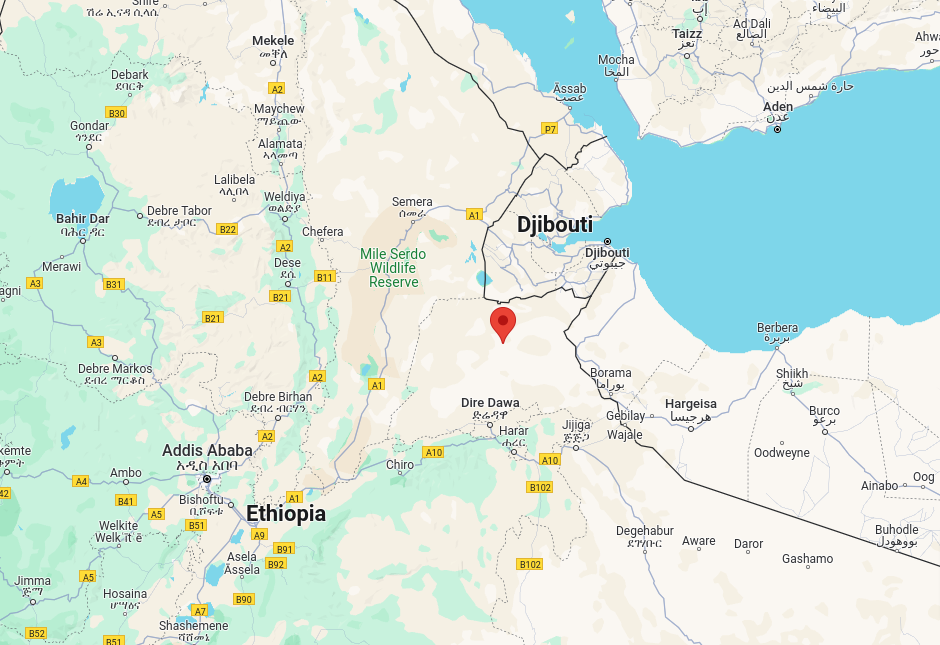

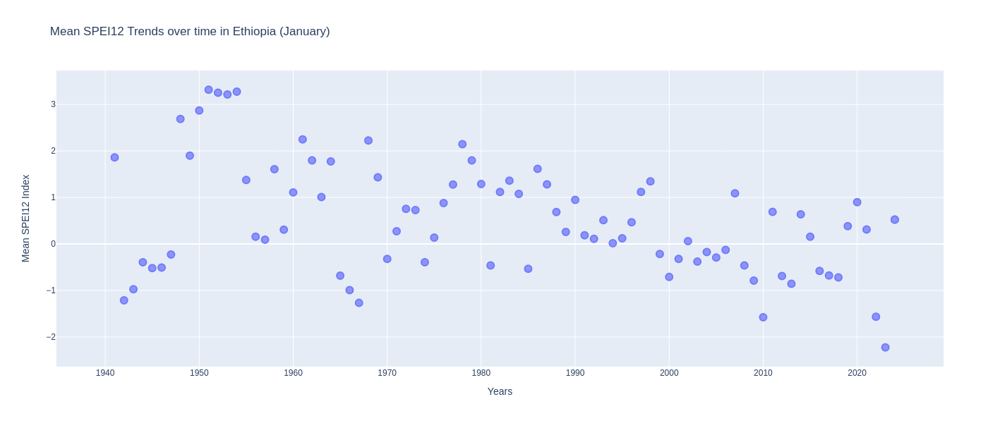

In [33]:
exclude_lats = [10.5] # even if they don't influence the mean
exclude_lons = [41.25, 41.50, 42.00]

mask = ~((spei12_ethiopia_region['lat'] == exclude_lats[0]) & 
         spei12_ethiopia_region['lon'].isin(exclude_lons))

# Apply the mask to filter the dataset
filtered_data = spei12_ethiopia_region.where(mask, drop=True)
mean_spei = filtered_data['SPEI12'].mean(dim=['lat', 'lon'])


# mean_spei = spei12_ethiopia_region['SPEI12'].mean(dim=['lat', 'lon'])
times = spei12_ethiopia_region['time'].values
trace = go.Scatter(
    x=times,
    y=mean_spei,
    mode='markers',
    name='Mean SPEI12',
    marker=dict(size=10,
    color='#8A94F9',
    line=dict(width=2,
    color='#717BFA')))

fig = go.Figure([trace])

fig.update_layout(
    title='Mean SPEI12 Trends over time in Ethiopia (January)',
    xaxis_title='Years',
    yaxis_title='Mean SPEI12 Index',
    height=600
)

fig.show()

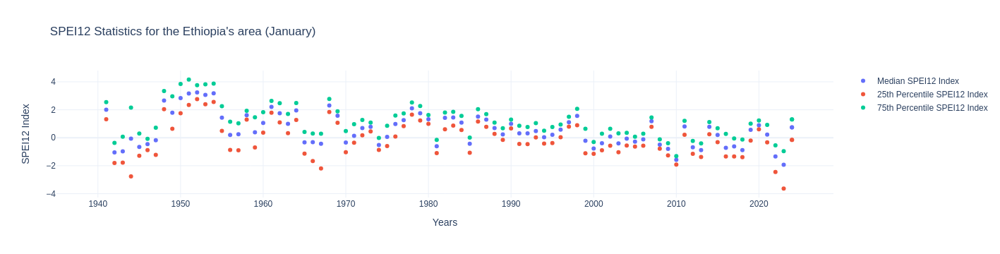

In [34]:
# Calculate median, 25th and 75th percentiles across the selected latitudes and longitudes
spei12_ethiopia_median = spei12_ethiopia_region.median(dim=['lat', 'lon'])
spei12_ethiopia_p25 = spei12_ethiopia_region.quantile(0.25, dim=['lat', 'lon'])
spei12_ethiopia_p75 = spei12_ethiopia_region.quantile(0.75, dim=['lat', 'lon'])

spei12_ethiopia_df = pd.DataFrame({
    'time': spei12_ethiopia_median['time'].values,
    'Median SPEI12': spei12_ethiopia_median['SPEI12'].values,
    '25th Percentile': spei12_ethiopia_p25['SPEI12'].values,
    '75th Percentile': spei12_ethiopia_p75['SPEI12'].values
})


fig = go.Figure()
fig.add_trace(go.Scatter(x=spei12_ethiopia_df['time'], y=spei12_ethiopia_df['Median SPEI12'],
                         mode='markers', name='Median SPEI12 Index'))
fig.add_trace(go.Scatter(x=spei12_ethiopia_df['time'], y=spei12_ethiopia_df['25th Percentile'],
                         mode='markers', name='25th Percentile SPEI12 Index'))
fig.add_trace(go.Scatter(x=spei12_ethiopia_df['time'], y=spei12_ethiopia_df['75th Percentile'],
                         mode='markers', name='75th Percentile SPEI12 Index'))
fig.update_layout(title="SPEI12 Statistics for the Ethiopia's area (January)",
                  xaxis_title='Years',
                  yaxis_title='SPEI12 Index',
                  template='plotly_white')
fig.show()